In [1]:
import tensorlayer as tl
import tensorflow as tf
import rawpy

import model
import utils

from PIL import Image
import numpy as np
import glob
import importlib
from PIL import Image

/home/hoppe/.local/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [26]:
importlib.reload(model)
importlib.reload(utils)

<module 'utils' from '/home/hoppe/Code/rgb2raw/utils.py'>

In [2]:
t_image = tf.placeholder('float32', [1, None, None, 3], name='input_image')
net_g = SRGAN_g(t_image, is_train=False, reuse=False)

sess = tf.Session(config=tf.ConfigProto(allow_soft_placement=True, log_device_placement=False))
tl.layers.initialize_global_variables(sess)
# tl.files.load_and_assign_npz(sess=sess, name=checkpoint_dir + '/g_srgan.npz', network=net_g)

[TL] InputLayer  SRGAN_g/in: (1, ?, ?, 3)
[TL] Conv2d SRGAN_g/n64s1/c: n_filter: 64 filter_size: (3, 3) strides: (1, 1) pad: SAME act: relu
[TL] Conv2d SRGAN_g/n64s1/c1/0: n_filter: 64 filter_size: (3, 3) strides: (1, 1) pad: SAME act: No Activation
[TL] BatchNormLayer SRGAN_g/n64s1/b1/0: decay: 0.900000 epsilon: 0.000010 act: relu is_train: False
[TL] Conv2d SRGAN_g/n64s1/c2/0: n_filter: 64 filter_size: (3, 3) strides: (1, 1) pad: SAME act: No Activation
[TL] BatchNormLayer SRGAN_g/n64s1/b2/0: decay: 0.900000 epsilon: 0.000010 act: No Activation is_train: False
[TL] ElementwiseLayer SRGAN_g/b_residual_add/0: size: (1, ?, ?, 64) fn: add
[TL] Conv2d SRGAN_g/n64s1/c1/1: n_filter: 64 filter_size: (3, 3) strides: (1, 1) pad: SAME act: No Activation
[TL] BatchNormLayer SRGAN_g/n64s1/b1/1: decay: 0.900000 epsilon: 0.000010 act: relu is_train: False
[TL] Conv2d SRGAN_g/n64s1/c2/1: n_filter: 64 filter_size: (3, 3) strides: (1, 1) pad: SAME act: No Activation
[TL] BatchNormLayer SRGAN_g/n64s1/b

[TL] Conv2d SRGAN_g/n64s1/c/m: n_filter: 64 filter_size: (3, 3) strides: (1, 1) pad: SAME act: No Activation
[TL] BatchNormLayer SRGAN_g/n64s1/b/m: decay: 0.900000 epsilon: 0.000010 act: No Activation is_train: False
[TL] ElementwiseLayer SRGAN_g/add3: size: (1, ?, ?, 64) fn: add
[TL] Conv2d SRGAN_g/n256s1/1: n_filter: 256 filter_size: (3, 3) strides: (1, 1) pad: SAME act: No Activation
[TL] SubpixelConv2d  SRGAN_g/pixelshufflerx2/1: scale: 2 n_out_channel: 64 act: relu
[TL] Conv2d SRGAN_g/n256s1/2: n_filter: 256 filter_size: (3, 3) strides: (1, 1) pad: SAME act: No Activation
[TL] SubpixelConv2d  SRGAN_g/pixelshufflerx2/2: scale: 2 n_out_channel: 64 act: relu
[TL] Conv2d SRGAN_g/out: n_filter: 1 filter_size: (1, 1) strides: (1, 1) pad: SAME act: tanh
[TL] WARNING: Function: `tensorlayer.layers.utils.initialize_global_variables` (in file: /home/hwa125/.local/lib/python3.6/site-packages/tensorlayer/layers/utils.py) is deprecated and will be removed after 2018-09-30.
Instructions for upd

In [3]:
img = Image.open('/home/hwa125/code/Learning-to-See-in-the-Dark/output/model.png')
img = img.resize((500,500))
data = np.asarray(img, dtype="int32" )

In [4]:
out = sess.run(net_g.outputs, {t_image: [data]})

ResourceExhaustedError: OOM when allocating tensor with shape[1,256,1000,1000] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node SRGAN_g/n256s1/2/Conv2D}} = Conv2D[T=DT_FLOAT, data_format="NCHW", dilations=[1, 1, 1, 1], padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/device:GPU:0"](SRGAN_g/pixelshufflerx2/1/Relu, SRGAN_g/n256s1/2/kernel/read)]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

	 [[{{node SRGAN_g/out/Tanh/_3}} = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/device:CPU:0", send_device="/job:localhost/replica:0/task:0/device:GPU:0", send_device_incarnation=1, tensor_name="edge_1057_SRGAN_g/out/Tanh", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/device:CPU:0"]()]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.


Caused by op 'SRGAN_g/n256s1/2/Conv2D', defined at:
  File "/opt/anaconda3/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/opt/anaconda3/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/opt/anaconda3/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/opt/anaconda3/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 505, in start
    self.io_loop.start()
  File "/opt/anaconda3/lib/python3.6/site-packages/tornado/platform/asyncio.py", line 132, in start
    self.asyncio_loop.run_forever()
  File "/opt/anaconda3/lib/python3.6/asyncio/base_events.py", line 422, in run_forever
    self._run_once()
  File "/opt/anaconda3/lib/python3.6/asyncio/base_events.py", line 1434, in _run_once
    handle._run()
  File "/opt/anaconda3/lib/python3.6/asyncio/events.py", line 145, in _run
    self._callback(*self._args)
  File "/opt/anaconda3/lib/python3.6/site-packages/tornado/ioloop.py", line 758, in _run_callback
    ret = callback()
  File "/opt/anaconda3/lib/python3.6/site-packages/tornado/stack_context.py", line 300, in null_wrapper
    return fn(*args, **kwargs)
  File "/opt/anaconda3/lib/python3.6/site-packages/tornado/gen.py", line 1233, in inner
    self.run()
  File "/opt/anaconda3/lib/python3.6/site-packages/tornado/gen.py", line 1147, in run
    yielded = self.gen.send(value)
  File "/opt/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 370, in dispatch_queue
    yield self.process_one()
  File "/opt/anaconda3/lib/python3.6/site-packages/tornado/gen.py", line 346, in wrapper
    runner = Runner(result, future, yielded)
  File "/opt/anaconda3/lib/python3.6/site-packages/tornado/gen.py", line 1080, in __init__
    self.run()
  File "/opt/anaconda3/lib/python3.6/site-packages/tornado/gen.py", line 1147, in run
    yielded = self.gen.send(value)
  File "/opt/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 357, in process_one
    yield gen.maybe_future(dispatch(*args))
  File "/opt/anaconda3/lib/python3.6/site-packages/tornado/gen.py", line 326, in wrapper
    yielded = next(result)
  File "/opt/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 267, in dispatch_shell
    yield gen.maybe_future(handler(stream, idents, msg))
  File "/opt/anaconda3/lib/python3.6/site-packages/tornado/gen.py", line 326, in wrapper
    yielded = next(result)
  File "/opt/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 534, in execute_request
    user_expressions, allow_stdin,
  File "/opt/anaconda3/lib/python3.6/site-packages/tornado/gen.py", line 326, in wrapper
    yielded = next(result)
  File "/opt/anaconda3/lib/python3.6/site-packages/ipykernel/ipkernel.py", line 294, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/opt/anaconda3/lib/python3.6/site-packages/ipykernel/zmqshell.py", line 536, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/opt/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2817, in run_cell
    raw_cell, store_history, silent, shell_futures)
  File "/opt/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2843, in _run_cell
    return runner(coro)
  File "/opt/anaconda3/lib/python3.6/site-packages/IPython/core/async_helpers.py", line 67, in _pseudo_sync_runner
    coro.send(None)
  File "/opt/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3018, in run_cell_async
    interactivity=interactivity, compiler=compiler, result=result)
  File "/opt/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3183, in run_ast_nodes
    if (yield from self.run_code(code, result)):
  File "/opt/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3265, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-2-04c47b422d99>", line 2, in <module>
    net_g = SRGAN_g(t_image, is_train=False, reuse=False)
  File "/home/hwa125/code/rgb2raw/model.py", line 43, in SRGAN_g
    n = Conv2d(n, 256, (3, 3), (1, 1), act=None, padding='SAME', W_init=w_init, name='n256s1/2')
  File "/home/hwa125/.local/lib/python3.6/site-packages/tensorlayer/decorators/deprecated_alias.py", line 24, in wrapper
    return f(*args, **kwargs)
  File "/home/hwa125/.local/lib/python3.6/site-packages/tensorlayer/layers/convolution/simplified_conv.py", line 212, in __init__
    self.outputs = conv2d(self.inputs)  # must put before ``new_variables``
  File "/opt/anaconda3/lib/python3.6/site-packages/tensorflow/python/layers/base.py", line 364, in __call__
    outputs = super(Layer, self).__call__(inputs, *args, **kwargs)
  File "/opt/anaconda3/lib/python3.6/site-packages/tensorflow/python/keras/engine/base_layer.py", line 769, in __call__
    outputs = self.call(inputs, *args, **kwargs)
  File "/opt/anaconda3/lib/python3.6/site-packages/tensorflow/python/keras/layers/convolutional.py", line 186, in call
    outputs = self._convolution_op(inputs, self.kernel)
  File "/opt/anaconda3/lib/python3.6/site-packages/tensorflow/python/ops/nn_ops.py", line 869, in __call__
    return self.conv_op(inp, filter)
  File "/opt/anaconda3/lib/python3.6/site-packages/tensorflow/python/ops/nn_ops.py", line 521, in __call__
    return self.call(inp, filter)
  File "/opt/anaconda3/lib/python3.6/site-packages/tensorflow/python/ops/nn_ops.py", line 205, in __call__
    name=self.name)
  File "/opt/anaconda3/lib/python3.6/site-packages/tensorflow/python/ops/gen_nn_ops.py", line 957, in conv2d
    data_format=data_format, dilations=dilations, name=name)
  File "/opt/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/op_def_library.py", line 787, in _apply_op_helper
    op_def=op_def)
  File "/opt/anaconda3/lib/python3.6/site-packages/tensorflow/python/util/deprecation.py", line 488, in new_func
    return func(*args, **kwargs)
  File "/opt/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/ops.py", line 3272, in create_op
    op_def=op_def)
  File "/opt/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/ops.py", line 1768, in __init__
    self._traceback = tf_stack.extract_stack()

ResourceExhaustedError (see above for traceback): OOM when allocating tensor with shape[1,256,1000,1000] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node SRGAN_g/n256s1/2/Conv2D}} = Conv2D[T=DT_FLOAT, data_format="NCHW", dilations=[1, 1, 1, 1], padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/device:GPU:0"](SRGAN_g/pixelshufflerx2/1/Relu, SRGAN_g/n256s1/2/kernel/read)]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

	 [[{{node SRGAN_g/out/Tanh/_3}} = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/device:CPU:0", send_device="/job:localhost/replica:0/task:0/device:GPU:0", send_device_incarnation=1, tensor_name="edge_1057_SRGAN_g/out/Tanh", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/device:CPU:0"]()]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.



## read data from file

In [4]:
x = rawpy.imread('test_data/' + train_data_list[2])

In [15]:
x.raw_image_visible 

array([[ 512,  512,  520, ..., 1272,  928, 1248],
       [ 508,  512,  512, ..., 1064, 1304, 1064],
       [ 512,  512,  516, ..., 1308,  928, 1288],
       ...,
       [ 516,  516,  520, ...,  532,  560,  520],
       [ 516,  516,  512, ...,  560,  616,  572],
       [ 516,  516,  520, ...,  552,  592,  556]], dtype=uint16)

In [59]:
train_data_list

['sony_a500_03.arw',
 'sony_a500_08.arw',
 'sony_a500_07.arw',
 'sony_a7s_ii_38.arw']

In [3]:
train_data_list = tl.files.load_file_list('test_data', regx = '.*.arw', printable = False)

raw1, rgb1, rgb2 = get_one_example('test_data/' + train_data_list[2])

NameError: name 'get_one_example' is not defined

In [36]:
raw1.max()

1.0134207010269165

## Config

In [5]:
from config import config, log_config

###====================== HYPER-PARAMETERS ===========================###
## Adam
batch_size = config.TRAIN.batch_size
lr_init = config.TRAIN.lr_init
beta1 = config.TRAIN.beta1
## initialize G
n_epoch_init = config.TRAIN.n_epoch_init
## adversarial learning (SRGAN)
n_epoch = config.TRAIN.n_epoch
lr_decay = config.TRAIN.lr_decay
decay_every = config.TRAIN.decay_every

## Define Model

In [2]:
batch_size = 8
from model import *
from utils import *

In [3]:
t_image = tf.placeholder('float32', [batch_size, 96, 96, 3], name='t_image_input_to_SRGAN_generator')
t_target_image = tf.placeholder('float32', [batch_size, 384, 384, 1], name='t_target_image')

net_g = SRGAN_g(t_image, is_train=True, reuse=False)
net_d, logits_real = SRGAN_d(t_target_image, is_train=True, reuse=False)
_, logits_fake = SRGAN_d(net_g.outputs, is_train=True, reuse=True)

net_g.print_params(False)
# net_g.print_layers()
net_d.print_params(False)
# net_d.print_layers()

## test inference
net_g_test = SRGAN_g(t_image, is_train=False, reuse=True)

[TL] InputLayer  SRGAN_g/in: (8, 96, 96, 3)
[TL] Conv2dLayer SRGAN_g/n64s1/c: shape:(3, 3, 3, 64) strides:(1, 1, 1, 1) pad:SAME act:relu
[TL] Conv2dLayer SRGAN_g/n64s1/c1/0: shape:(3, 3, 64, 64) strides:(1, 1, 1, 1) pad:SAME act:identity
[TL] BatchNormLayer SRGAN_g/n64s1/b1/0: decay:0.900000 epsilon:0.000010 act:relu is_train:True
[TL] Conv2dLayer SRGAN_g/n64s1/c2/0: shape:(3, 3, 64, 64) strides:(1, 1, 1, 1) pad:SAME act:identity
[TL] BatchNormLayer SRGAN_g/n64s1/b2/0: decay:0.900000 epsilon:0.000010 act:identity is_train:True
[TL] ElementwiseLayer SRGAN_g/b_residual_add/0: size:(8, 96, 96, 64) fn:add
[TL] Conv2dLayer SRGAN_g/n64s1/c1/1: shape:(3, 3, 64, 64) strides:(1, 1, 1, 1) pad:SAME act:identity
[TL] BatchNormLayer SRGAN_g/n64s1/b1/1: decay:0.900000 epsilon:0.000010 act:relu is_train:True
[TL] Conv2dLayer SRGAN_g/n64s1/c2/1: shape:(3, 3, 64, 64) strides:(1, 1, 1, 1) pad:SAME act:identity
[TL] BatchNormLayer SRGAN_g/n64s1/b2/1: decay:0.900000 epsilon:0.000010 act:identity is_train:

[TL] SubpixelConv2d  pixelshufflerx2/2_new: scale: 2 n_out_channel: 64 act: relu
[TL] Conv2dLayer SRGAN_g/out_new: shape:(1, 1, 64, 1) strides:(1, 1, 1, 1) pad:SAME act:tanh
[TL] InputLayer  SRGAN_d/input/images: (8, 384, 384, 1)
[TL] Conv2dLayer SRGAN_d/h0/c: shape:(4, 4, 1, 64) strides:(1, 2, 2, 1) pad:SAME act:<lambda>
[TL] Conv2dLayer SRGAN_d/h1/c: shape:(4, 4, 64, 128) strides:(1, 2, 2, 1) pad:SAME act:identity
[TL] BatchNormLayer SRGAN_d/h1/bn: decay:0.900000 epsilon:0.000010 act:<lambda> is_train:True
[TL] Conv2dLayer SRGAN_d/h2/c: shape:(4, 4, 128, 256) strides:(1, 2, 2, 1) pad:SAME act:identity
[TL] BatchNormLayer SRGAN_d/h2/bn: decay:0.900000 epsilon:0.000010 act:<lambda> is_train:True
[TL] Conv2dLayer SRGAN_d/h3/c: shape:(4, 4, 256, 512) strides:(1, 2, 2, 1) pad:SAME act:identity
[TL] BatchNormLayer SRGAN_d/h3/bn: decay:0.900000 epsilon:0.000010 act:<lambda> is_train:True
[TL] Conv2dLayer SRGAN_d/h4/c: shape:(4, 4, 512, 1024) strides:(1, 2, 2, 1) pad:SAME act:identity
[TL] B

[TL]   param  45: SRGAN_g/n64s1/b1/4/moving_mean:0 (64,)              float32_ref
[TL]   param  46: SRGAN_g/n64s1/b1/4/moving_variance:0 (64,)              float32_ref
[TL]   param  47: SRGAN_g/n64s1/c2/4/W_conv2d:0 (3, 3, 64, 64)     float32_ref
[TL]   param  48: SRGAN_g/n64s1/b2/4/beta:0 (64,)              float32_ref
[TL]   param  49: SRGAN_g/n64s1/b2/4/gamma:0 (64,)              float32_ref
[TL]   param  50: SRGAN_g/n64s1/b2/4/moving_mean:0 (64,)              float32_ref
[TL]   param  51: SRGAN_g/n64s1/b2/4/moving_variance:0 (64,)              float32_ref
[TL]   param  52: SRGAN_g/n64s1/c1/5/W_conv2d:0 (3, 3, 64, 64)     float32_ref
[TL]   param  53: SRGAN_g/n64s1/b1/5/beta:0 (64,)              float32_ref
[TL]   param  54: SRGAN_g/n64s1/b1/5/gamma:0 (64,)              float32_ref
[TL]   param  55: SRGAN_g/n64s1/b1/5/moving_mean:0 (64,)              float32_ref
[TL]   param  56: SRGAN_g/n64s1/b1/5/moving_variance:0 (64,)              float32_ref
[TL]   param  57: SRGAN_g/n64s1/c2/5

[TL]   param 148: SRGAN_g/n64s1/b2/14/beta:0 (64,)              float32_ref
[TL]   param 149: SRGAN_g/n64s1/b2/14/gamma:0 (64,)              float32_ref
[TL]   param 150: SRGAN_g/n64s1/b2/14/moving_mean:0 (64,)              float32_ref
[TL]   param 151: SRGAN_g/n64s1/b2/14/moving_variance:0 (64,)              float32_ref
[TL]   param 152: SRGAN_g/n64s1/c1/15/W_conv2d:0 (3, 3, 64, 64)     float32_ref
[TL]   param 153: SRGAN_g/n64s1/b1/15/beta:0 (64,)              float32_ref
[TL]   param 154: SRGAN_g/n64s1/b1/15/gamma:0 (64,)              float32_ref
[TL]   param 155: SRGAN_g/n64s1/b1/15/moving_mean:0 (64,)              float32_ref
[TL]   param 156: SRGAN_g/n64s1/b1/15/moving_variance:0 (64,)              float32_ref
[TL]   param 157: SRGAN_g/n64s1/c2/15/W_conv2d:0 (3, 3, 64, 64)     float32_ref
[TL]   param 158: SRGAN_g/n64s1/b2/15/beta:0 (64,)              float32_ref
[TL]   param 159: SRGAN_g/n64s1/b2/15/gamma:0 (64,)              float32_ref
[TL]   param 160: SRGAN_g/n64s1/b2/15/mov

[TL] BatchNormLayer SRGAN_g/n64s1/b1/4: decay:0.900000 epsilon:0.000010 act:relu is_train:False
[TL] Conv2dLayer SRGAN_g/n64s1/c2/4: shape:(3, 3, 64, 64) strides:(1, 1, 1, 1) pad:SAME act:identity
[TL] BatchNormLayer SRGAN_g/n64s1/b2/4: decay:0.900000 epsilon:0.000010 act:identity is_train:False
[TL] ElementwiseLayer SRGAN_g/b_residual_add/4: size:(8, 96, 96, 64) fn:add
[TL] Conv2dLayer SRGAN_g/n64s1/c1/5: shape:(3, 3, 64, 64) strides:(1, 1, 1, 1) pad:SAME act:identity
[TL] BatchNormLayer SRGAN_g/n64s1/b1/5: decay:0.900000 epsilon:0.000010 act:relu is_train:False
[TL] Conv2dLayer SRGAN_g/n64s1/c2/5: shape:(3, 3, 64, 64) strides:(1, 1, 1, 1) pad:SAME act:identity
[TL] BatchNormLayer SRGAN_g/n64s1/b2/5: decay:0.900000 epsilon:0.000010 act:identity is_train:False
[TL] ElementwiseLayer SRGAN_g/b_residual_add/5: size:(8, 96, 96, 64) fn:add
[TL] Conv2dLayer SRGAN_g/n64s1/c1/6: shape:(3, 3, 64, 64) strides:(1, 1, 1, 1) pad:SAME act:identity
[TL] BatchNormLayer SRGAN_g/n64s1/b1/6: decay:0.9000

## Define training op

In [6]:
d_loss1 = tl.cost.sigmoid_cross_entropy(logits_real, tf.ones_like(logits_real), name='d1')
d_loss2 = tl.cost.sigmoid_cross_entropy(logits_fake, tf.zeros_like(logits_fake), name='d2')
d_loss = d_loss1 + d_loss2

g_gan_loss = 1e-3 * tl.cost.sigmoid_cross_entropy(logits_fake, tf.ones_like(logits_fake), name='g')
mse_loss = tl.cost.mean_squared_error(net_g.outputs, t_target_image, is_mean=True)
# vgg_loss = 2e-6 * tl.cost.mean_squared_error(vgg_predict_emb.outputs, vgg_target_emb.outputs, is_mean=True)

# g_loss = mse_loss + vgg_loss + g_gan_loss
g_loss = mse_loss + g_gan_loss

g_vars = tl.layers.get_variables_with_name('SRGAN_g', True, True)
d_vars = tl.layers.get_variables_with_name('SRGAN_d', True, True)

with tf.variable_scope('learning_rate'):
    lr_v = tf.Variable(lr_init, trainable=False)
## Pretrain
g_optim_init = tf.train.AdamOptimizer(lr_v, beta1=beta1).minimize(mse_loss, var_list=g_vars)
## SRGAN
g_optim = tf.train.AdamOptimizer(lr_v, beta1=beta1).minimize(g_loss, var_list=g_vars)
d_optim = tf.train.AdamOptimizer(lr_v, beta1=beta1).minimize(d_loss, var_list=d_vars)

[TL]   [*] geting variables with SRGAN_g
[TL]   got   0: SRGAN_g/n64s1/c/W_conv2d:0   (3, 3, 3, 64)
[TL]   got   1: SRGAN_g/n64s1/c/b_conv2d:0   (64,)
[TL]   got   2: SRGAN_g/n64s1/c1/0/W_conv2d:0   (3, 3, 64, 64)
[TL]   got   3: SRGAN_g/n64s1/b1/0/beta:0   (64,)
[TL]   got   4: SRGAN_g/n64s1/b1/0/gamma:0   (64,)
[TL]   got   5: SRGAN_g/n64s1/c2/0/W_conv2d:0   (3, 3, 64, 64)
[TL]   got   6: SRGAN_g/n64s1/b2/0/beta:0   (64,)
[TL]   got   7: SRGAN_g/n64s1/b2/0/gamma:0   (64,)
[TL]   got   8: SRGAN_g/n64s1/c1/1/W_conv2d:0   (3, 3, 64, 64)
[TL]   got   9: SRGAN_g/n64s1/b1/1/beta:0   (64,)
[TL]   got  10: SRGAN_g/n64s1/b1/1/gamma:0   (64,)
[TL]   got  11: SRGAN_g/n64s1/c2/1/W_conv2d:0   (3, 3, 64, 64)
[TL]   got  12: SRGAN_g/n64s1/b2/1/beta:0   (64,)
[TL]   got  13: SRGAN_g/n64s1/b2/1/gamma:0   (64,)
[TL]   got  14: SRGAN_g/n64s1/c1/2/W_conv2d:0   (3, 3, 64, 64)
[TL]   got  15: SRGAN_g/n64s1/b1/2/beta:0   (64,)
[TL]   got  16: SRGAN_g/n64s1/b1/2/gamma:0   (64,)
[TL]   got  17: SRGAN_g/n64s1

In [35]:
raw = rawpy.imread('test_data/' + train_data_list[0])
rgb = raw.postprocess(use_camera_wb=True, half_size=False, no_auto_bright=True, output_bps=8)

#crop the img
H = raw.sizes.raw_height
W = raw.sizes.raw_width

#     xx = np.random.randint(0, W - crop_size)
#     yy = np.random.randint(0, H - crop_size)

#     rgb = rgb[yy:yy + crop_size, xx:xx + crop_size, :]
# rgb = np.float32(rgb / 65535.0)
# print(rgb.max())
# rgb = tl.prepro.imresize(rgb, [int(crop_size/4), int(crop_size/4)])
# print(rgb.max())
# rgb = np.expand_dims(np.float32(rgb / 65535.0), axis=0)

# raw_matrix = raw.raw_image_visible.astype(np.float32)
# raw_matrix = np.maximum(raw_matrix - 512, 0) / (16383 - 512)

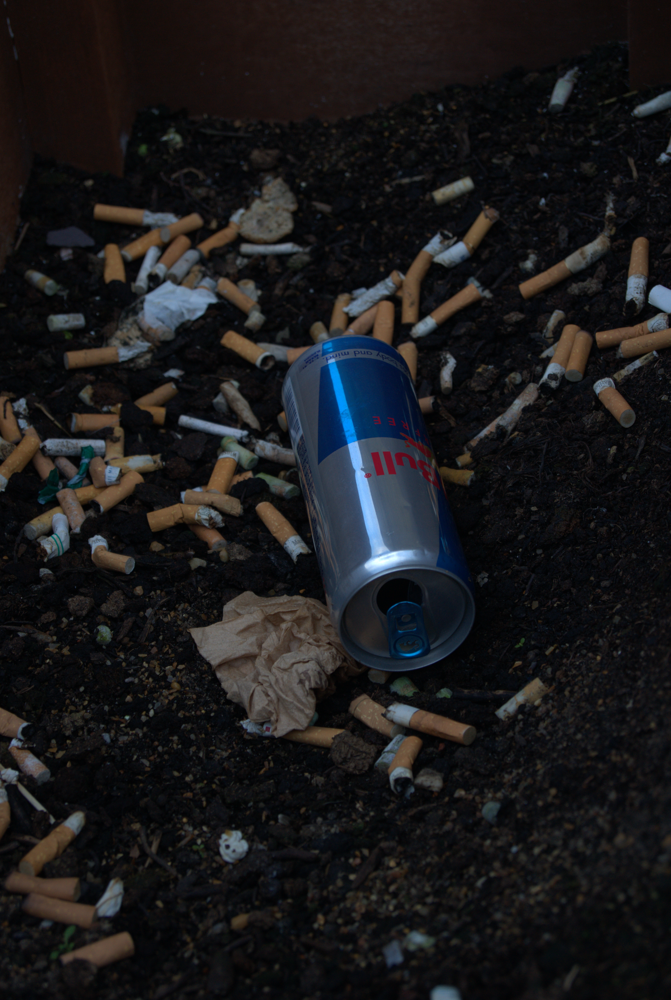

In [37]:
img  = Image.fromarray(rgb)